In [1]:
# standard libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
pd.set_option('display.max_columns', None)
plt.rcParams['figure.figsize'] = (4, 2.5)
plt.rcParams.update({'font.size': 7})

# others
import pickle
from tqdm import tqdm
import re
import warnings
warnings.filterwarnings('ignore')

# Introduction

As we have already scrapped the data from [SKYTRAX](https://www.airlinequality.com/airline-reviews/british-airways/) website on British Airways, and done the data wrangling process on the previos notebook, now we can perform our analysis or modelling. Before doing that let's start with asking some simple questions to be answered for Exaploratory Data Analysis Section.

| Questions |
| :------: |
| What is the overall rating given by customers when they either recommend or don't recommend this airline? |
| How does the passenger overall rating and satisfaction level vary across different type of seat? |
| How does the passenger overall rating and satisfaction level vary across different type of traveller? |
| What are the common key words that are used by the passengers on the review? |

After doing that, we will use text mining technique that is Topic Modeling. Topic Modeling is a technique which provides methods for identifying co-occurring keywords to summarize large collections of textual information. It helps in discovering hidden topics in the document, annotate the documents with these topics, and organize a large amount of unstructured data. Discovering topics are beneficial for various purposes such as for clustering documents, organizing online available content for information retrieval and recommendations. 

# Load the dataset

In [2]:
# load the dataset
df = pd.read_csv('dataset/British_Airways_Reviews.csv', parse_dates = ['Published Date', 'Fly Date'])
df

,Passenger Name,Published Date,Country,Headers,Reviews,Verified,Fly Date,Departure,Via Route,Arrival,Aircraft Type,Traveller Type,Seat Type,Seat Comfort,Cabin Staff Service,Food and Beverages,Inflight Entertainment,Ground Service,Wifi and Connectivity,Value For Money,Overall Rating,Recommended
0,Terry Thomason,2023-10-08,United States,our luggage was soaking wet,✅ Trip Verified | Our connecting flight from L...,Verified,2023-09-01,Atlanta,London,Glasgow,NaN,Couple Leisure,Economy Class,3.0,3.0,1.0,4.0,1.0,4.0,3.0,1,no
1,T Hanson,2023-10-07,Australia,The worst airline I have ever flown,✅ Trip Verified | The worst airline I have e...,Verified,2023-10-01,Singapore,NaN,Sydney,Boeing 787,Couple Leisure,Economy Class,1.0,1.0,2.0,1.0,1.0,NaN,1.0,1,no
2,Peter Costello,2023-10-07,United Kingdom,Excellent service levels,"✅ Trip Verified | Excellent service levels, ...",Verified,2023-10-01,London,NaN,New York JFK,Boeing 777,Solo Leisure,First Class,5.0,5.0,5.0,4.0,5.0,5.0,5.0,10,yes
3,Kane Kelly,2023-10-05,United Kingdom,British Airways was absolutely shocking,Not Verified | Booked a very special holiday ...,Not Verified,2023-08-01,Heathrow,NaN,Marseille,BA366,Couple Leisure,Business Class,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1,no
4,Gary Storer,2023-10-03,United Kingdom,service was mediocre at best,"Not Verified | Just returned from Chicago, fle...",Not Verified,2023-10-01,Chicago,Heathrow,Manchester,A380,Couple Leisure,Economy Class,2.0,3.0,1.0,NaN,2.0,NaN,2.0,2,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3649,W Benson,2012-08-29,United Kingdom,British Airways customer review,LHR-HKG on Boeing 747 - 23/08/12. Much has bee...,Not Verified,NaT,NaN,NaN,NaN,NaN,NaN,Economy Class,2.0,3.0,2.0,3.0,NaN,NaN,3.0,5,no
3650,S Luqman,2012-08-29,United Kingdom,British Airways customer review,Just got back from Bridgetown Barbados flying ...,Not Verified,NaT,NaN,NaN,NaN,NaN,NaN,Economy Class,2.0,3.0,1.0,4.0,NaN,NaN,2.0,10,no
3651,D Smith,2012-08-29,United Kingdom,British Airways customer review,LHR-JFK-LAX-LHR. Check in was ok apart from be...,Not Verified,NaT,NaN,NaN,NaN,NaN,NaN,Economy Class,2.0,3.0,1.0,4.0,NaN,NaN,3.0,9,no
3652,Michael Dielissen,2012-08-29,Canada,British Airways customer review,YYZ to LHR - July 2012 - I flew overnight in p...,Not Verified,NaT,NaN,NaN,NaN,NaN,NaN,Premium Economy,4.0,3.0,3.0,4.0,NaN,NaN,4.0,4,yes


# Data profiling

In this section, we will be examine our dataset like does the missing values have any pattern? which columns should be dropped since they aren't useful for our analysis? or etc.

In [3]:
# helper function to create summary of data
def create_summary_df(data):
    print(f'Number of Rows: {data.shape[0]}')
    print(f'Number of Columns: {data.shape[1]}')
    columns = data.columns.tolist()
    missing = data.isnull().sum().to_frame('# Missing Values')
    missing_pct = (data.isnull().sum()/data.shape[0]*100).to_frame('% Missing Values')
    nunique = pd.DataFrame([data[col].nunique() for col in columns], index = columns, columns = ['# Unique Values'])
    most_cat = pd.DataFrame([data[col].value_counts(dropna = False, ascending = False).index[0] for col in columns], index = columns, columns = ['Most Category'])
    most_val = pd.DataFrame([data[col].value_counts(dropna = False, ascending = False).values[0] for col in columns], index = columns, columns = ['# Most Category'])
    data_types = pd.DataFrame([data[col].dtype for col in columns], index = columns, columns = ['Data Types'])
    output = pd.concat([missing, missing_pct, nunique, most_cat, most_val, data_types], axis = 1)
    return output

Number of Rows: 3654
Number of Columns: 22


,# Missing Values,% Missing Values,# Unique Values,Most Category,# Most Category,Data Types
Passenger Name,538,14.723591,2558,NaN,538,object
Published Date,0,0.000000,1794,2015-01-19 00:00:00,26,datetime64[ns]
Country,2,0.054735,71,United Kingdom,2297,object
Headers,0,0.000000,2649,British Airways customer review,942,object
Reviews,0,0.000000,3654,✅ Trip Verified | Our connecting flight from L...,1,object
Verified,0,0.000000,3,Verified,1902,object
Fly Date,764,20.908593,111,NaT,764,datetime64[ns]
Departure,761,20.826492,374,NaN,761,object
Via Route,3154,86.316366,49,NaN,3154,object
Arrival,779,21.319102,419,NaN,779,object


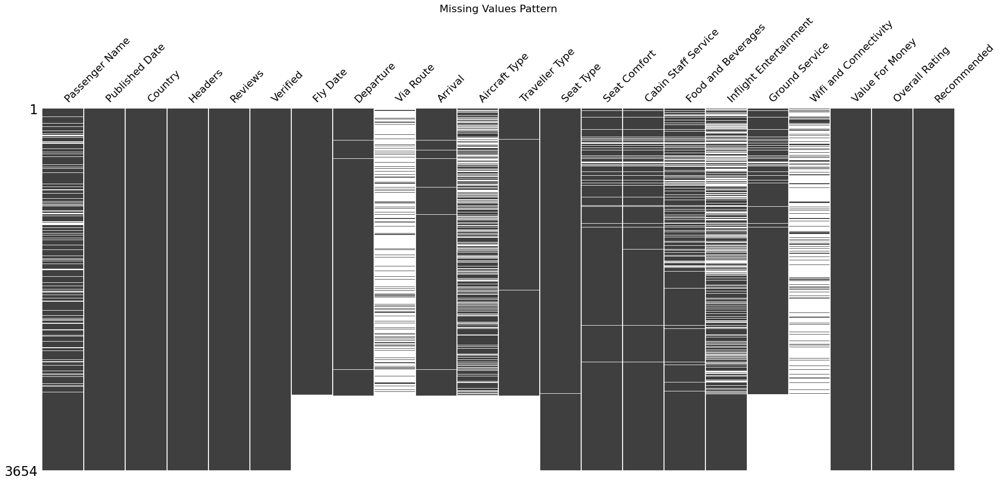

,Passenger Name,Published Date,Country,Headers,Reviews,Verified,Fly Date,Departure,Via Route,Arrival,Aircraft Type,Traveller Type,Seat Type,Seat Comfort,Cabin Staff Service,Food and Beverages,Inflight Entertainment,Ground Service,Wifi and Connectivity,Value For Money,Overall Rating,Recommended
Published Year,,,,,,,,,,,,,,,,,,,,,,
2012,7,7,7,7,7,7,0,0,0,0,0,0,7,7,7,7,7,0,0,7,7,7
2014,463,464,463,464,464,464,0,0,0,0,0,0,464,464,464,464,464,0,0,464,464,464
2015,665,734,733,734,734,734,441,447,78,445,338,451,732,729,729,708,581,438,66,734,734,734
2016,464,570,570,570,570,570,570,570,111,570,427,570,570,565,565,551,398,570,85,570,570,570
2017,466,572,572,572,572,572,572,572,77,569,393,571,572,561,560,503,364,570,103,572,572,572
2018,244,324,324,324,324,324,324,324,52,321,216,324,324,316,312,264,188,317,57,324,324,324
2019,284,356,356,356,356,356,356,356,65,355,218,356,356,341,340,288,211,348,80,356,356,356
2020,86,104,104,104,104,104,104,104,19,103,55,104,104,82,82,71,49,86,27,104,104,104
2021,68,87,87,87,87,87,87,86,10,83,44,87,87,76,75,62,33,81,27,87,87,87


In [4]:
# summary data
display(create_summary_df(df))

# plot amount of missingness
import missingno as msno
fig, ax = plt.subplots(figsize = (25, 10))
msno.matrix(df, sparkline = False, ax = ax)
plt.title('Missing Values Pattern', size = 16)
plt.show()

# count non-null values in the dataset for every columns by each year published
df['Published Year'] = df['Published Date'].dt.year
df.groupby('Published Year').count()

Insights:
- A lot of missing values are found in `Wifi and Connectivity` and `Via Route` (up to 80%) &rarr; drop these columns.
- Some irrelevant columns such as `Passenger Name` and `Aircraft Type` are not useful for analysis &rarr; drop these columns.
- Only 7 reviews are not missing in 2012 year, and there are a lot of missing values in 2014 year and 2015 (All reviews were also not verified) &rarr; drop all data points in 2012 to 2015 years.
- It seems there is a missing values pattern within `Seat Comfort` and `Cabin Staff Service` &rarr; impute those values in the next section.

In [5]:
# drop columns
dropped_columns = ['Wifi and Connectivity', 'Via Route', 'Passenger Name', 'Aircraft Type']
df_EDA = df.drop(dropped_columns, axis = 1)

# drop years in 2012, 2013, 2014, and 2015
df_EDA = df_EDA[~df_EDA['Published Year'].isin([2012, 2013, 2014, 2015])]

Number of Rows: 2449
Number of Columns: 19


,# Missing Values,% Missing Values,# Unique Values,Most Category,# Most Category,Data Types
Published Date,0,0.000000,1464,2016-09-14 00:00:00,8,datetime64[ns]
Country,0,0.000000,67,United Kingdom,1509,object
Headers,0,0.000000,2388,British Airways customer review,10,object
Reviews,0,0.000000,2449,✅ Trip Verified | Our connecting flight from L...,1,object
Verified,0,0.000000,2,Verified,1902,object
Fly Date,0,0.000000,101,2017-04-01 00:00:00,65,datetime64[ns]
Departure,3,0.122499,348,London,469,object
Arrival,19,0.775827,378,London,386,object
Traveller Type,3,0.122499,4,Couple Leisure,826,object
Seat Type,0,0.000000,4,Economy Class,1339,object


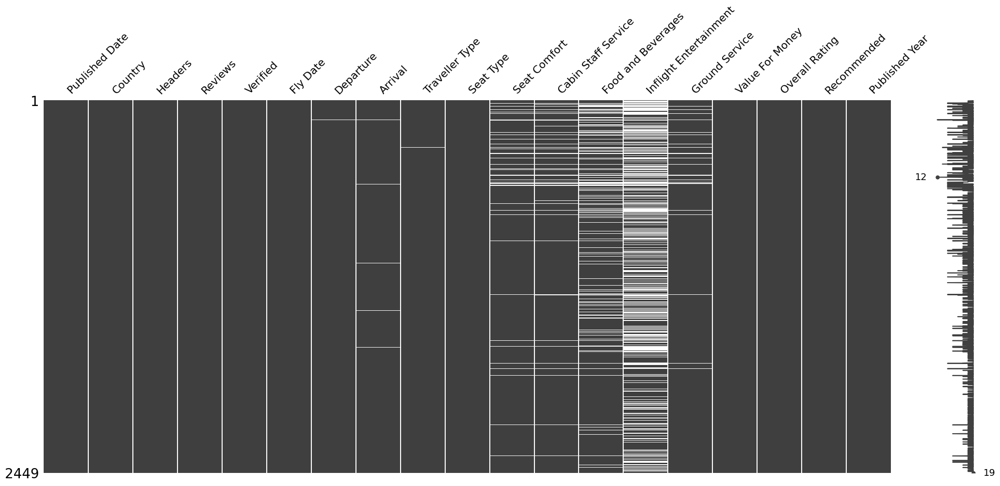

In [6]:
# check the data again
display(create_summary_df(df_EDA))
msno.matrix(df_EDA)
plt.show()

Insights:
- The data much better for now. Majority of missing values has been removed, and now we only has minority ones. Next we will use imputation techniques to fill those missing values.

## Impute missing values

1. Three imputation techniques will be used and evaluated for imputing missing values in `Seat Comfort`, `Cabin Staff Service`, `Food and Beverages`, and `Ground Service` columns. Then Root Mean Squared Error (RMSE) will be used as the evaluation metric.
    - Mean imputation.
    - SoftImpute imputation. 
    - MICE (Multiple Imputation by Chained Equations) imputation.


2. Mode imputation technique will used for imputing missing values in `Departure `, `Arrival`, and `Traveller Type`.

### Mean, SoftImpute, and MICE imputation

In [7]:
from sklearn.preprocessing import OrdinalEncoder, MinMaxScaler
from fancyimpute import IterativeImputer, SoftImpute
from sklearn.impute import SimpleImputer

# function to perform imputation
def create_incomplete_df(complete, column, scaler, sample = 0.15):
    missing = complete.isnull().sum()[complete.isnull().sum() != 0].index
    complete = complete.dropna(subset = [col for col in missing if col not in column])
    incomplete = complete.copy()
    index = incomplete.sample(int(np.round(sample*complete.shape[0])), random_state = 42).index
    incomplete.loc[index, [column]] = np.nan
    incomplete_scaled = pd.DataFrame(scaler.transform(incomplete), columns = incomplete.columns, index = incomplete.index)
    return incomplete_scaled, index

def impute_missing_values(data_input, imputer, scaler, index):
    data_output = data_input.copy(deep = True)
    data_output.iloc[:, :] = imputer.fit_transform(data_input)
    data_output = pd.DataFrame(scaler.inverse_transform(data_output), columns = data_input.columns, index = data_input.index)
    return data_output

def RMSE(complete, incomplete, index, column):
    series = (complete.loc[index, [column]] - incomplete.loc[index, [column]])**2
    return np.sqrt(series.sum()/series.shape[0])[0]

def evaluation_imputation(complete, column, scaler):
    incomplete_scaled, index = create_incomplete_df(complete, column, scaler)
    df_MICE = impute_missing_values(incomplete_scaled, IterativeImputer(max_iter = 500), scaler, index)
    df_soft = impute_missing_values(incomplete_scaled, SoftImpute(verbose = False), scaler, index)
    df_mean = impute_missing_values(incomplete_scaled, SimpleImputer(strategy = 'mean'), scaler, index)
    print(f"{column} Imputation - RMSE (MICE): {RMSE(complete, df_MICE, index, column)}")
    print(f"{column} Imputation - RMSE (SoftImpute): {RMSE(complete, df_soft, index, column)}")   
    print(f"{column} Imputation - RMSE (Mean Imputation): {RMSE(complete, df_mean, index, column)}")

In [8]:
## select the features to be used as the training data ##
used_column = ['Traveller Type', 'Seat Type', 'Seat Comfort', 'Cabin Staff Service', 'Inflight Entertainment',
               'Food and Beverages', 'Ground Service', 'Value For Money', 'Overall Rating', 'Recommended']
df_complete = df_EDA[used_column]

## preprocess the data ##
# ordinal ecoding
OE = OrdinalEncoder(categories = [['Economy Class', 'Premium Economy', 'Business Class', 'First Class'], ['no', 'yes']])                                      
df_OE = pd.DataFrame(OE.fit_transform(df_complete[['Seat Type', 'Recommended']]), columns = ['Seat Type', 'Recommended'])

# one-hot encoding
df_OHE = pd.get_dummies(df_complete['Traveller Type'], prefix = 'Traveler')

# concatenate all
df_complete = pd.concat([df_OE, df_OHE, df_complete[['Seat Comfort', 'Cabin Staff Service', 'Inflight Entertainment', 'Food and Beverages', 'Ground Service', 'Value For Money', 'Overall Rating']]], axis = 1)

# normalization
scaler = MinMaxScaler()
df_complete_scaled = pd.DataFrame(scaler.fit_transform(df_complete), columns = df_complete.columns)

In [9]:
## Seat Comfort ##
evaluation_imputation(df_complete, 'Seat Comfort', scaler)
print()

## Cabin Staff Service ##
evaluation_imputation(df_complete, 'Cabin Staff Service', scaler)
print()

## Food and Beverages ##
evaluation_imputation(df_complete, 'Food and Beverages', scaler)
print()

## Ground Service ##
evaluation_imputation(df_complete, 'Ground Service', scaler)
print()

## Inflight Entertainment ##
evaluation_imputation(df_complete, 'Inflight Entertainment', scaler)
print()

Seat Comfort Imputation - RMSE (MICE): 0.8062429234789523
Seat Comfort Imputation - RMSE (SoftImpute): 0.8494198517231752
Seat Comfort Imputation - RMSE (Mean Imputation): 1.2452878489663868

Cabin Staff Service Imputation - RMSE (MICE): 0.9221164748580564
Cabin Staff Service Imputation - RMSE (SoftImpute): 1.0447023608940442
Cabin Staff Service Imputation - RMSE (Mean Imputation): 1.4799109140212225

Food and Beverages Imputation - RMSE (MICE): 0.7882644450252676
Food and Beverages Imputation - RMSE (SoftImpute): 0.8480758034706164
Food and Beverages Imputation - RMSE (Mean Imputation): 1.414591001952963

Ground Service Imputation - RMSE (MICE): 1.0772620924302037
Ground Service Imputation - RMSE (SoftImpute): 1.1166391578347536
Ground Service Imputation - RMSE (Mean Imputation): 1.46124614021069

Inflight Entertainment Imputation - RMSE (MICE): 0.8880208512472771
Inflight Entertainment Imputation - RMSE (SoftImpute): 0.926568117561092
Inflight Entertainment Imputation - RMSE (Mean Im

As we can see on the RMSE scores, the best imputation technique is **Multiple Imputation by Chained Equations (MICE)** giving the lowest RMSE score.

In [10]:
# impute missing values to the dataset using MICE technique
mice = IterativeImputer(max_iter = 500)
df_imputation = pd.DataFrame(scaler.inverse_transform(mice.fit_transform(df_complete_scaled)), columns = df_complete_scaled.columns)

# round the imputation values
columns = ['Seat Comfort', 'Cabin Staff Service', 'Food and Beverages', 'Ground Service', 'Inflight Entertainment']
df_imputation = df_imputation[columns].apply(lambda x: round(x))

# assign the results
df_EDA_imputation = df_EDA.copy()
df_EDA_imputation.loc[:, columns] = df_imputation.loc[:, columns]

### Mode imputation

In [11]:
# mode imputation for categorical columns
df_EDA_imputation = df_EDA_imputation.fillna({'Departure':df_EDA_imputation['Departure'].mode()[0],
                                              'Arrival':df_EDA_imputation['Arrival'].mode()[0],
                                              'Traveller Type':df_EDA_imputation['Traveller Type'].mode()[0]})

# Exploratory Data Analysis (EDA)

> *Note*:
<br> *As a reminder, the dataset used for this EDA section and later on (Modeling) is stored in the variable `df_EDA_imputation`*

In [12]:
# store numerical and categorical columns
num = ['Seat Comfort', 'Cabin Staff Service', 'Food and Beverages', 'Ground Service', 'Inflight Entertainment', 'Value For Money', 'Overall Rating']
cat = ['Verified', 'Traveller Type', 'Seat Type', 'Recommended', 'Published Year']
df_EDA_imputation['Published Year'] = df_EDA_imputation['Published Year'].astype('object')

# helper function to plot data distribution of numerical columns
def check_dist_num(input_data, columns):
    fig = plt.figure(figsize = (25, 25))
    i = 1
    for col in input_data[columns].columns:
        plt.subplot(6, 6, i)
        ax = sns.boxplot(x = input_data[col], color = '#90B77D')
        ax.set(xlabel = None, ylabel = None)
        plt.title(str(col), loc = 'center', fontsize = 16)
        plt.xticks(rotation = 20, fontsize = 13)
        plt.yticks(fontsize = 13)
        plt.tight_layout()
        i += 1
    plt.show()

    fig = plt.figure(figsize = (25, 25))
    i = 1
    for col in input_data[columns].columns:
        plt.subplot(6, 6, i)
        ax = sns.distplot(x = input_data[col], color = '#90B77D')
        ax.set(xlabel = None, ylabel = None)
        plt.title(str(col), loc = 'center', fontsize = 16)
        plt.xticks(rotation = 20, fontsize = 13)
        plt.yticks(fontsize = 13)
        plt.tight_layout()
        i += 1
    plt.show()
    
# helper function to plot data distribution of categorical columns
def check_dist_cat(input_data, columns):
    fig = plt.figure(figsize = (15, 11))
    i = 1
    for col in input_data[columns].columns:
        plt.subplot(5, 5, i)
        ax = sns.countplot(data = input_data[columns], y = input_data[col], palette = 'tab20')
        ax.set(xlabel = None, ylabel = None)
        plt.title(str(col), loc = 'center', fontsize = 10)
        plt.xticks(rotation = 0, fontsize = 8)
        plt.yticks(fontsize = 8)
        plt.tight_layout()
        i += 1
    plt.show()

## Univariate analysis

Numerical columns:
- Either outliers or anomalies are not found in our dataset.
- Min and max values are also good.
- Looks like the distributions are skewed to the right indicating that more low satisfaction levels are given by the reviewers, especially for `Food and Beverages`, `Ground Service`, and `Value For Money`.

Categorical columns:
- "Verified" reviews are dominant.
- "Couple" and "Solo" travellers are the main passengers, followed by "Business" traveller.
- "Business Class" and "Economy Class" cabins are often booked.
- Reviewers are more likely not to recommend British Airways.
- Only a few reviews were made in 2020 and 2021 because this is the peak of Covid-19 where lock-down was enforced.

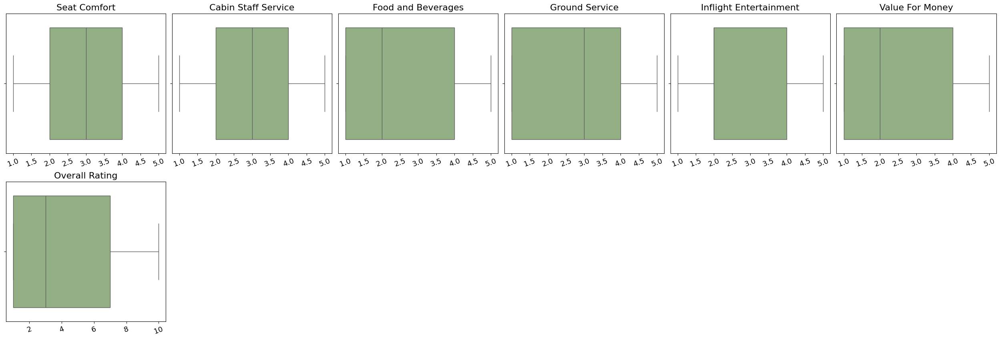

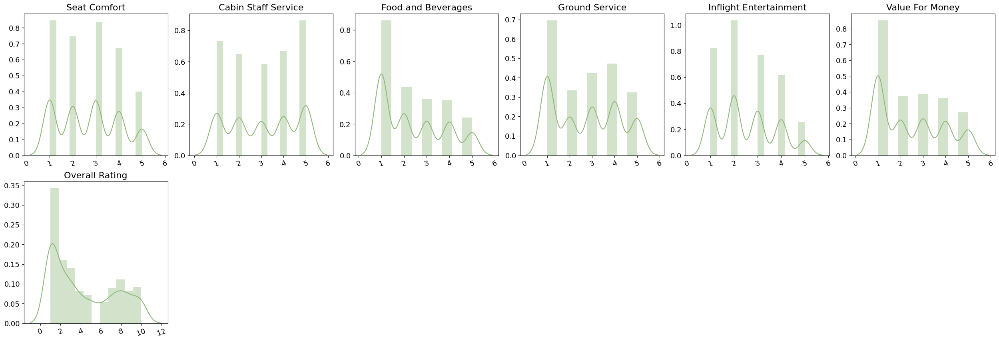

,count,mean,std,min,25%,50%,75%,max
Seat Comfort,2449.0,2.724377,1.324566,1.0,2.0,3.0,4.0,5.0
Cabin Staff Service,2449.0,3.082483,1.481275,1.0,2.0,3.0,4.0,5.0
Food and Beverages,2449.0,2.409147,1.400869,1.0,1.0,2.0,4.0,5.0
Ground Service,2449.0,2.730502,1.448480,1.0,1.0,3.0,4.0,5.0
Inflight Entertainment,2449.0,2.558595,1.229379,1.0,2.0,2.0,4.0,5.0
Value For Money,2449.0,2.478971,1.433887,1.0,1.0,2.0,4.0,5.0
Overall Rating,2449.0,4.294814,3.129630,1.0,1.0,3.0,7.0,10.0


In [13]:
# numerical columns
check_dist_num(df_EDA_imputation, num)
df_EDA_imputation[num].describe().T

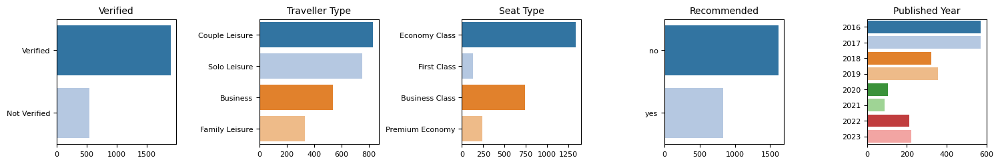

,count,unique,top,freq
Verified,2449,2,Verified,1902
Traveller Type,2449,4,Couple Leisure,829
Seat Type,2449,4,Economy Class,1339
Recommended,2449,2,no,1614
Published Year,2449,8,2017,572


In [14]:
# categorical columns
check_dist_cat(df_EDA_imputation, cat)
df_EDA_imputation[cat].describe().T

## Let's answer the asked question!

In [15]:
# helper function
def ovr_rating_and_sat_level(column_group, data, palette, num = num):
    # create mean aggregation groupby 'column_group'
    groupby = data[num + [column_group]].groupby([column_group]).mean()

    # calculate satisfaction level by each category and ovr rating
    OVR_Rating = groupby[['Overall Rating']].reset_index()
    Satisfaction = groupby[['Seat Comfort', 'Cabin Staff Service', 'Food and Beverages','Ground Service', 'Inflight Entertainment', 'Value For Money']].reset_index()
    Satisfaction = Satisfaction.melt(id_vars = column_group, var_name = 'Category', value_name = 'Satisfaction Level')
    order = OVR_Rating.sort_values('Overall Rating', ascending = False)[column_group].tolist()
    
    # plot ovr rating
    fig1, ax = plt.subplots(figsize = (4, 2))
    sns.barplot(data = OVR_Rating, x = 'Overall Rating', y = column_group, order = order, palette = palette)
    ax.set(title = f'AVG Overall Rating by "{column_group}"', ylabel = None)
    plt.show()

    # plot satisfaction level
    fig2, ax = plt.subplots(figsize = (5, 3))
    sns.barplot(data = Satisfaction, x = 'Satisfaction Level', hue = column_group, y = 'Category', hue_order = order, palette = palette)
    ax.set(title = f'AVG Satisfaction Level by "{column_group}" and per Category')
    ax.legend(loc = "center left", bbox_to_anchor = (1, 0.5))
    plt.show()
    return fig1, fig2

###  What is the overall rating given by passengers when they recommend and don't recommend to use this airline? 

- 34% of reviewers recommended British Airways Airline with 8 out of 10 stars *Overall Rating*.
- 66% of reviewers didn't recommend it with 2.35 out of 10 stars *Overall Rating*.

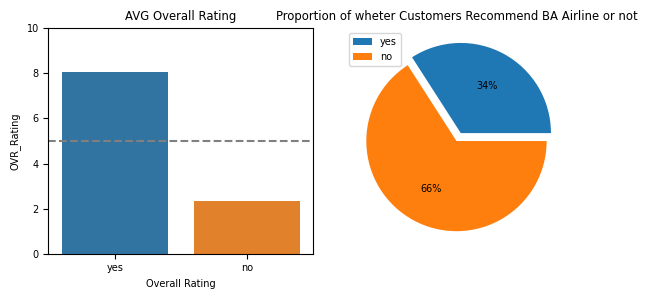

In [16]:
# count the number of reviewer and their respective ovr rating by 'Recommended'
order = ['yes', 'no']
Recommended = df_EDA_imputation.groupby('Recommended').agg(Reviewer = ('Overall Rating', 'count'),
                                                           OVR_Rating = ('Overall Rating', 'mean')).loc[order]
# plotting results
fig, ax = plt.subplots(figsize = (6, 3), ncols = 2)

sns.barplot(data = Recommended.reset_index(), y = 'OVR_Rating', x = 'Recommended', palette = 'tab10', ax = ax[0], order = order)
ax[0].set(title = 'AVG Overall Rating', xlabel = 'Overall Rating')
ax[0].axhline(y = 5, linestyle = '--', color = 'gray')
ax[0].set_ylim([0, 10])
Recommended.plot(explode = [0.1, 0], kind = 'pie', y = 'Reviewer', autopct = '%.0f%%', colors = sns.color_palette('tab10'), ax = ax[1], labels = None)
ax[1].set(title = 'Proportion of wheter Customers Recommend BA Airline or not', ylabel = None)

plt.tight_layout()
plt.show()

fig.savefig('image/task 1/Content by Category.png', bbox_inches = 'tight', dpi = 300)

### How does the passenger overall rating and satisfaction level vary across different type of seat?

- As we might expect that "First Class" will be giving us the highest *Overall Rating* then followed by "Business Class", and the lowest is "Economy Class".
- Also the pattern is the same for the *Satisfaction Level* per category where "First Class" is the highest and "Economy Class" is the lowest.
- This is very reasonable since "First Class" would be providing far better facilities, services, foods, or beverages most of the time.

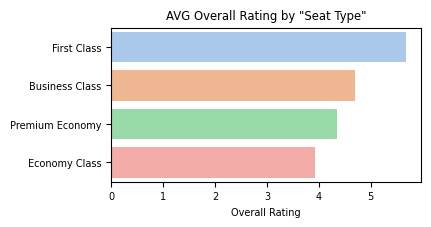

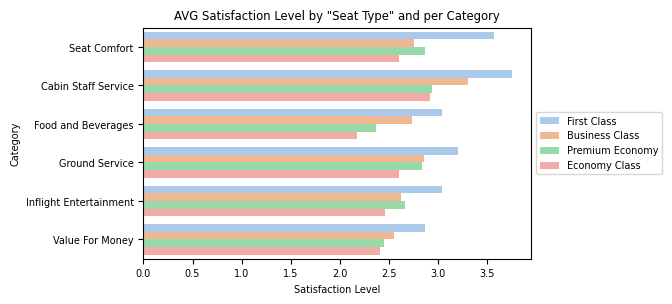

In [17]:
# groupby 'Seat Type'
fig1, fig2 = ovr_rating_and_sat_level('Seat Type', df_EDA_imputation, palette = 'pastel')
fig1.savefig('image/task 1/Rating by Seat Type.png', bbox_inches = 'tight', dpi = 300)
fig2.savefig('image/task 1/Satisfaction by Seat Type.png', bbox_inches = 'tight', dpi = 300)

### How does the passenger overall rating and satisfaction level vary across different type of traveller?

- Turns out "Solo" traveller gives us the highest *Overall Rating* than "Business" traveller, meaning that they enjoy the airline experience the most (The highest *Satisfaction Level*) compared to "Business" traveller.
- **My hypothesis is** that probably most of "Solo" travellers tend to book high quality `Seat Type`, such as "First Class" and "Business Class", so that they can spend their time with high quality services while going on vacation or long route journey. **But we need to check and validate it first!!!**

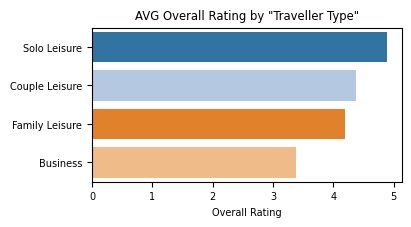

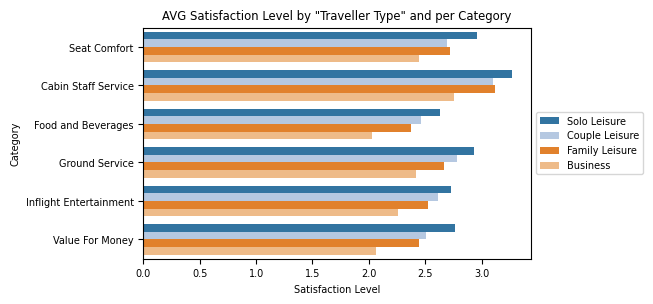

In [18]:
# 'Traveller Type'
fig1, fig2 = ovr_rating_and_sat_level('Traveller Type', df_EDA_imputation, palette = 'tab20')
fig1.savefig('image/task 1/Rating by Traveller Type.png', bbox_inches = 'tight', dpi = 300)
fig2.savefig('image/task 1/Satisfaction by Traveller Type.png', bbox_inches = 'tight', dpi = 300)

Let's dive deeper into the `Traveller Type`, specifically "Solo" and "Business" traveller reviewers, and their preferred `Seat Type`. Some insights we have been found:
- **Apparently my previous hypothesis is wrong!**
- "Business" traveller often books for "Business Class" cabin while "Solo" traveller books more often in "Economy Class" cabin.
- "Business" traveller tends to give us *Overall Rating* below 5 stars most of the time regardless of whether it is "First Class" or "Business Class", meanwhile "Solo" traveller tends to give us above 5 stars *Overall Rating* for the "First Class", "Business Class" and "Premium Economy".

As we know "First Class" and "Business Class" cabin would provide passenger the best facilities and services, but unfortunately "Business" traveller doesn't seem to have a good experience on it so much. Their satisfactions and overal rating to the services and facilities within "First Class" and "Business Class" are relatively low.

To gain more insights, let's use the `Reviews` data!

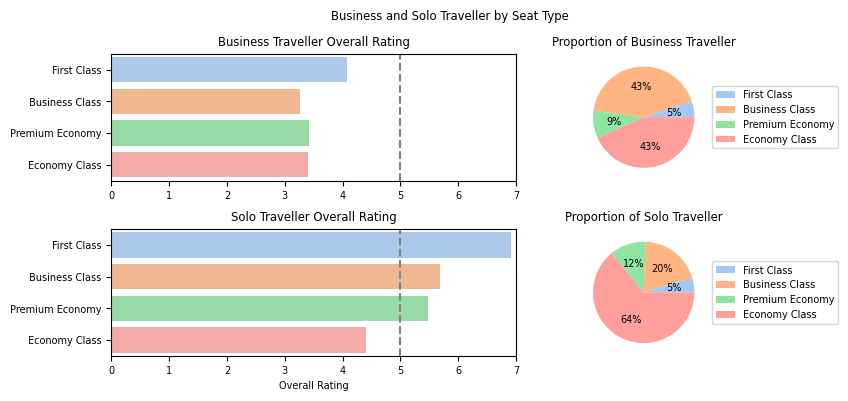

In [19]:
# count the number of reviewer and their respective ovr rating by 'Traveller Type' and 'Seat Type'
Traveller_Seat = df_EDA_imputation.groupby(['Traveller Type', 'Seat Type']).agg(Reviewer = ('Overall Rating', 'count'),
                                                                                OVR_Rating = ('Overall Rating', 'mean'))

# get Business and Solo traveller
Business = Traveller_Seat.loc['Business']
Solo = Traveller_Seat.loc['Solo Leisure']

# plotting results
fig, ax = plt.subplots(figsize = (9, 4), nrows = 2, ncols = 2)
order = ['First Class', 'Business Class', 'Premium Economy', 'Economy Class']

sns.barplot(data = Business[['OVR_Rating']].reset_index(), y = 'Seat Type', x = 'OVR_Rating', order = order, palette = 'pastel', ax = ax[0][0])
sns.barplot(data = Solo[['OVR_Rating']].reset_index(), y = 'Seat Type', x = 'OVR_Rating', order = order, palette = 'pastel', ax = ax[1][0])
ax[0][0].set(title = 'Business Traveller Overall Rating', xlabel = None, ylabel = None)
ax[1][0].set(title = 'Solo Traveller Overall Rating', xlabel = 'Overall Rating', ylabel = None)
ax[0][0].set_xlim([0, 7])
ax[1][0].set_xlim([0, 7])
ax[0][0].axvline(x = 5, linestyle = '--', color = 'gray')
ax[1][0].axvline(x = 5, linestyle = '--', color = 'gray')

Business[['Reviewer']].loc[order].plot(kind = 'pie', y = 'Reviewer', autopct = '%.0f%%', colors = sns.color_palette('pastel'), ax = ax[0][1], legend = None, labels = None)
Solo[['Reviewer']].loc[order].plot(kind = 'pie', y = 'Reviewer', autopct = '%.0f%%', colors = sns.color_palette('pastel'), ax = ax[1][1], legend = None, labels = None)
ax[0][1].set(title = 'Proportion of Business Traveller', xlabel = None, ylabel = None)
ax[1][1].set(title = 'Proportion of Solo Traveller', xlabel = None, ylabel = None)
ax[0][1].legend(order, loc = "center left", bbox_to_anchor = (1, 0.5))
ax[1][1].legend(order, loc = "center left", bbox_to_anchor = (1, 0.5))

plt.suptitle('Business and Solo Traveller by Seat Type')
plt.tight_layout()
plt.show()

fig.savefig('image/task 1/Rating and Satisfaction by Seat Type (Business and Solo Traveller).png', bbox_inches = 'tight', dpi = 300)

### What are the common key words that are used by the passengers on the review?

- From the Word Cloud generated below, we can suggest that the common key words used within the reviews are "Seat", "Food", "Service", "Time", and "Staff" showing that people are actively talking about their experience about on those categories. 
- The "Good" word also highlighted on the Word Cloud, this have to be the positive sentiment. Also the word "Hour" might be indicating waiting time for delayed schedule.

In [20]:
from wordcloud import WordCloud, STOPWORDS
from nltk.corpus import stopwords
from PIL import Image

# create stopword list
stops = set()
stopwords_nltk = list(stopwords.words('english'))
stopwords_wc = list(STOPWORDS)
stops.update(stopwords_nltk + stopwords_wc + ['flight', 'airline', 'BA', 'British Airways', 'British Airway', 'Trip', 'Verified', 'British', 'Airway', 'Airways'])

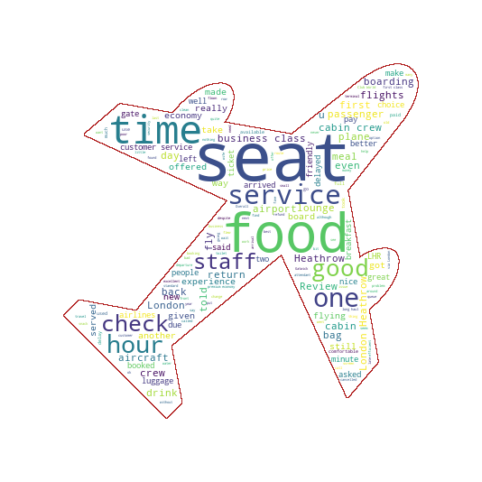

In [21]:
# OVERALL REVIEWS

# join all reviews in the dataset into a single text
text = ' '.join([review for review in df_EDA_imputation['Reviews']])
            
# generate a word cloud image
mask = np.array(Image.open('image/task 1/airplane mask.png'))
mask[mask == 0] = 255
wc = WordCloud(background_color = 'white', max_words = 250, max_font_size = 1000, mask = mask,
               stopwords = stops, contour_width = 0.5, contour_color = 'firebrick', random_state = 42).generate(text)

# show the image
plt.figure(figsize = (8, 6))
plt.imshow(wc, interpolation = 'bilinear')
plt.axis('off')
plt.show()

wc.to_file('image/task 1/WC overall reviews.png')

# Topic modeling (LDA)

In [22]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

import spacy
nlp = spacy.load('en_core_web_md', disable = ['parser', 'ner'])

import gensim.corpora as corpora
from gensim.models.ldamulticore import LdaMulticore
from gensim.models.coherencemodel import CoherenceModel
np.random.seed(42)

def preprocess_doc(doc):
    """ function to preprocess a string document using Spacy library
    input  : doc         - a string of doc
    output : cleaned_doc - a string of cleaned doc     
    """
    # use lower case, remove verification status, and create doc object
    doc = nlp(doc.lower().split('|')[-1]) 

    # tokenization and lemmatization while removing common stopwords, punctuations, whitespaces, and defined stopwords
    defined_stopwords = ['ba', 'british', 'airway', 'airways']
    cleaned_doc = [word.lemma_ for word in doc if (word.is_stop == False) & (word.is_punct == False) & (word.is_space == False) & (word.text not in defined_stopwords)]
    
    return ' '.join(cleaned_doc)

def gensim_dictionary_corpus(vocabulary, list_tokenized_docs):
    """ function to create gensim dictionary and corpus from sklearn
    input  : vocabulary          - vocabulary from fitted vectorizer sklearn
             list_tokenized_docs - inverse transform of resulting fitted vectorizer sklearn
    output : dictionary          - gensim dictionary
             corpus              - gensim corpus
    """
    # create dictionary
    dictionary = corpora.Dictionary([vocabulary])
    
    # create corpus
    corpus = [dictionary.doc2bow(doc) for doc in list_tokenized_docs]
    return dictionary, corpus

def compute_coherence_scores(corpus, dictionary, list_tokenized_docs, start = 2, max_topics = 5, step = 1):
    """ function to compute coherence scores of LDA model
    input  : corpus              - gensim corpus
             dictionary          - gensim dictionary
             list_tokenized_docs - inverse transform of resulting fitted vectorizer sklearn
             start               - start number of topics
             max_topics          - max number of topics
             step                - step taken
    output : models              - list of LDA models           
    """
    coherence_scores = []
    n_topics = []
    models = []
    for n in tqdm(range(start, max_topics + 1, step)):
        LDA_model = LdaMulticore(corpus = corpus, id2word = dictionary, num_topics = n,
                                 alpha = 'symmetric', eta = 'symmetric', decay = 0.7, offset = 10.0,
                                 chunksize = 128, passes = 15, batch = True, random_state = 42)    
        coherence = CoherenceModel(model = LDA_model, texts = list_tokenized_docs, dictionary = dictionary, coherence = 'c_v')
        coherence_scores.append(coherence.get_coherence())
        n_topics.append(n)
        models.append(LDA_model)   
    fig, ax = plt.subplots(figsize = (6, 4))
    ax.plot(n_topics, coherence_scores, marker = 'o')
    ax.set(title = 'Coherence Scores for each N Topics', xlabel = 'N Topics', ylabel = 'Coherence Score')
    plt.show()
    return models

## Text Preprocessing

We have defined the function to preprocess the text that is `preprocess_doc(doc)` function. The steps included are,
1. Lower case and remove verification status
2. Tokenization
3. Remove stopwords, punctuations, and whitespaces
4. Lemmatization

In [23]:
# preprocess 'Reviews' and store in 'Reviews_Preprocess'
df_EDA_imputation['Reviews_Preprocess'] = df_EDA_imputation['Reviews'].apply(lambda doc: preprocess_doc(doc))
df_EDA_imputation['Reviews_Preprocess']

0       connect flight london glasgow cancel force wai...
1       bad airline fly allocate row toilet galley cha...
2       excellent service level proactive crew superb ...
3       book special holiday partner september arrive ...
4       return chicago fly 10 day ago american airline...
                              ...                        
2444    london johannesburg return long haul flight da...
2445    usually fly asian airlines ana eva korean asia...
2446    fly london delhi rebooking miss connection fra...
2447    madrid los angeles london heathrow smooth depa...
2448    copenhagen chicago london heathrow club world ...
Name: Reviews_Preprocess, Length: 2449, dtype: object

## Create Bag of Words

### 1-gram

In [24]:
### create BoW (1-gram) ###

# create vectorizer object, and fit the data
vec_1_gram = CountVectorizer(min_df = 125,
                             max_df = 1.0,
                             ngram_range = (1, 1),
                             token_pattern = '[A-Za-z]+(?=\\s+)',
                             stop_words = ['london', 'heathrow', 'flight', 'plane', 'airline', 'class', 'fly', 'gatwick', 'lhr', 'wo'])
vec_1_gram.fit(df_EDA_imputation['Reviews_Preprocess'])

# store the data into DataFrame
data_1_gram = pd.DataFrame(vec_1_gram.transform(df_EDA_imputation['Reviews_Preprocess']).todense(), 
                            columns = vec_1_gram.get_feature_names_out())                  
display(data_1_gram)

# top 20 and bottom 20 words
vocab_1_gram = data_1_gram.sum().sort_values(ascending = False)
top_n_words = pd.DataFrame({'(Top 20 words, counts)':list(zip(vocab_1_gram.head(20).index, vocab_1_gram.head(20).values)),
                            '(Bottom 20 words, counts)':list(zip(vocab_1_gram.tail(20).index, vocab_1_gram.tail(20).values))})
top_n_words

,able,air,aircraft,airport,aisle,allow,arrival,arrive,ask,attendant,available,away,bad,bag,baggage,big,bit,board,boarding,book,booking,breakfast,business,buy,cabin,call,cancel,card,care,carrier,change,charge,cheap,check,choice,choose,clean,close,club,coffee,come,comfortable,complaint,connect,cost,crew,customer,day,decide,delay,departure,despite,different,dinner,drink,early,economy,efficient,end,entertainment,europe,excellent,expect,experience,extra,far,feel,finally,find,fine,food,free,friendly,gate,get,give,go,good,great,ground,half,hand,hard,haul,have,help,helpful,high,home,hot,hour,ife,include,inflight,issue,journey,keep,know,lack,land,late,later,leave,leg,let,like,line,little,long,look,lose,lot,lounge,low,luggage,main,make,manage,meal,mean,member,middle,min,minute,miss,money,month,need,new,nice,night,number,offer,ok,old,onboard,online,option,order,outbound,overall,pass,passenger,pay,people,phone,pleasant,point,poor,premium,price,problem,process,product,professional,provide,quality,queue,receive,refund,return,room,route,row,run,sandwich,say,schedule,screen,seat,seating,second,security,see,selection,serve,service,short,show,sit,sleep,small,snack,space,spend,staff,standard,start,system,take,tea,tell,terminal,th,thing,think,ticket,time,toilet,travel,trip,try,uncomfortable,use,usual,wait,want,water,way,week,well,wife,wine,work,world,year
0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0
1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,1,0,0,2,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,2,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,2,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,4,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0
3,2,2,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,7,0,0,2,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,2,0,1,0,0,0,1,3,0,0,0,0,0,0,0,0,1,0,4,0,0,0,0,0,1,0,1,0,0,0,1,0,0,2,1,0,3,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,2,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,1,0,1,0,0,0,2,0,0,0,1,1,0,1,0,0,1,0,2,0,2,0,0,3,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,1,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,

,"(Top 20 words, counts)","(Bottom 20 words, counts)"
0,"(seat, 2848)","(helpful, 155)"
1,"(service, 2003)","(inflight, 154)"
2,"(time, 1625)","(close, 153)"
3,"(food, 1486)","(hard, 152)"
4,"(good, 1422)","(care, 151)"
5,"(crew, 1396)","(cheap, 151)"
6,"(hour, 1343)","(decide, 150)"
7,"(cabin, 1269)","(let, 149)"
8,"(check, 1173)","(show, 149)"
9,"(business, 1074)","(lack, 148)"


### 2-grams

In [25]:
### create BoW (2-grams) ###

# create vectorizer object, and fit the data
vec_2_grams = CountVectorizer(min_df = 3,
                              max_df = 1.0,
                              ngram_range = (2, 2),
                              token_pattern = '[A-Za-z0-9]+(?=\\s+)',
                              stop_words = ['london', 'heathrow', 'club', 'business', 'premium', 'economy', 'cabin', 'customer'])
vec_2_grams.fit(df_EDA_imputation['Reviews_Preprocess'])

# store the data into DataFrame
data_2_grams = pd.DataFrame(vec_2_grams.transform(df_EDA_imputation['Reviews_Preprocess']).todense(), 
                            columns = vec_2_grams.get_feature_names_out())                  
display(data_2_grams)

# top 20 and bottom 20 words
vocab_2_grams = data_2_grams.sum().sort_values(ascending = False)
top_n_words = pd.DataFrame({'(Top 20 words, counts)':list(zip(vocab_2_grams.head(20).index, vocab_2_grams.head(20).values)),
                            '(Bottom 20 words, counts)':list(zip(vocab_2_grams.tail(20).index, vocab_2_grams.tail(20).values))})
top_n_words

,00 finally,00 flight,000 avio,1 2,1 3,1 bag,1 day,1 flight,1 hour,1 hr,1 lounge,1 month,1 pm,1 year,10 15,10 abreast,10 day,10 flight,10 hour,10 min,10 minute,10 pm,10 time,10 year,100 people,100 pound,100 time,11 flight,11 hour,12 day,12 hour,12 hr,12 month,13 hour,14 day,14 hour,15 hour,15 min,15 minute,15 pm,15 year,18 year,1st class,2 1,2 2,2 3,2 4,2 bag,2 call,2 child,2 choice,2 class,2 configuration,2 crew,2 day,2 drink,2 flight,2 half,2 hour,2 hr,2 long,2 meal,2 member,2 minute,2 month,2 piece,2 pm,2 row,2 seat,2 seating,2 service,2 small,2 staff,2 time,2 toilet,2 week,2 year,20 min,20 minute,20 passenger,20 year,200 flight,2016 flight,2020 flight,22 hour,23 kg,24 hour,24 hr,25 min,25 minute,25 year,250ml water,25th august,26 hour,2nd meal,3 2,3 3,3 4,3 bag,3 class,3 crew,3 day,3 flight,3 hour,3 hr,3 main,3 month,3 people,3 pm,3 row,3 seat,3 separate,3 staff,3 star,3 time,3 week,3 year,30 day,30 flight,30 hour,30 min,30 minute,30 pm,30 time,30 year,31 inch,32 kg,32 passenger,35 year,3rd party,4 2,4 3,4 5,4 check,4 day,4 flight,4 hour,4 month,4 pm,4 row,4 seat,4 star,4 time,4 travel,4 week,4 year,40 flight,40 min,40 minute,40 year,400 aircraft,400 class,4000 flight,45 min,45 minute,48 hour,5 10,5 3,5 6,5 chaotic,5 class,5 day,5 different,5 flight,5 ft,5 good,5 hour,5 hr,5 lounge,5 min,5 minute,5 month,5 passenger,5 pm,5 star,5 week,5 year,50 flight,50 min,50 minute,50 people,50 year,5000 avio,55 min,55 minute,6 7,6 day,6 flight,6 foot,6 ft,6 hour,6 month,6 people,6 pm,6 row,6 seat,6 week,60 min,60 minute,60th birthday,7 8,7 class,7 day,7 flight,7 hour,7 inch,7 minute,7 pm,7 seat,7 year,70 minute,72 hour,747 400,747 400s,747 flight,747 look,747 old,747 seat,747 show,75 minute,767 depart,777 200,777 300,777 300er,777 a380,777 aircraft,777 old,777 seat,787 9,787 900,7th january,8 10,8 abreast,8 class,8 day,8 flight,8 hour,8 month,8 passenger,8 pm,8 seat,8 time,80 minute,80 year,9 hour,9 month,9 pm,9 row,9 year,90 minute,99 hour,a320 seat,a321 neo,a380 class,a380 flight,a380 leave,a380 look,a380 nice,a380 quiet,a380 seat,a380 time,a380 upper,a380 wonderful,aa flight,able board,able book,able change,able check,able choose,able find,able flight,able fly,able help,able secure,able select,able sit,able sleep,able stretch,able use,aboard plane,absolute bad,absolute joke,absolutely appalling,absolutely awful,absolutely disgusting,absolutely fine,absolutely horrible,absolutely shambolic,absolutely shocking,absolutely terrible,abu dhabi,abysmal service,accept flight,acceptable breakfast,access aisle,access free,access lounge,access seat,access toilet,act like,actual flight,actually available,actually decent,actually find,actually fly,actually good,actually pay,actually want,add bag,add insult,add time,additional baggage,additional charge,additional cost,additional expense,additional seat,additional space,adequate flight,adequate seat,adequate short,adjustable headrest,advance notice,advance seat,adverse weather,advise essential,advise flight,aer lingus,afternoon flight,afternoon snack,afternoon tea,age 747,age aircraft,age b777,age plane,age seat,agent advise,agent ask,agent check,agent helpful,agent lounge,agent professional,agent say,agent speak,agent tell,ago flight,ago fly,ago staff,ahead schedule,ahead time,air belgium,air bridge,air canada,air conditioning,air fare,air flight,air france,air hostess,air lingus,air mile,air new,air quality,air stewardess,air tag,air traffic,air travel,air vent,airbus a380,aircraft 3,aircraft aircraft,aircraft airline,aircraft arrive,aircraft boarding,aircraft boeing,aircraft change,aircraft check,aircraft class,aircraft clean,aircraft comfortable,aircraft configuration,aircraft cramped,aircraft crew,aircraft delay,aircraft dirty,aircraft feel,aircraft filthy,aircraft flight,aircraft fly,aircraft food,aircraft good,aircraft half,aircraft interior,aircraft like,aircraft long,aircraft look,aircraft need,aircraft new,aircraft old,aircraft park,aircraft poor,aircraft route,aircraft seat,aircraft sea

,"(Top 20 words, counts)","(Bottom 20 words, counts)"
0,"(hour flight, 217)","(include infant, 3)"
1,"(return flight, 217)","(information delay, 3)"
2,"(long haul, 184)","(information luggage, 3)"
3,"(food drink, 161)","(involuntarily downgrade, 3)"
4,"(flight delay, 151)","(instead ask, 3)"
5,"(connect flight, 149)","(invite board, 3)"
6,"(flight attendant, 146)","(international carrier, 3)"
7,"(2 hour, 137)","(interior tired, 3)"
8,"(leg room, 134)","(interior plane, 3)"
9,"(low cost, 129)","(interior old, 3)"


In [26]:
### reduce features in "data_2_grams" by combining features sharing the same context,  ###
### e.g. 1 hour, 3 hours, and 5 hours values can be combined into "X hour" feature            ###

# new data for 2-grams
new_2_grams = data_2_grams.copy()

X_minute_columns = [col for col in new_2_grams.columns if re.findall(r'\d+ (minute|min)', col)]
new_2_grams['X minute'] = new_2_grams[X_minute_columns].sum(axis = 1)

X_hour_columns = [col for col in new_2_grams.columns if re.findall(r'\d+ (hour|hr)', col)]
new_2_grams['X hour'] = new_2_grams[X_hour_columns].sum(axis = 1)

X_dayweekmonth_columns = [col for col in new_2_grams.columns if re.findall(r'\d+ (day|week|month|year)', col)]
new_2_grams['X day/week/month/year'] = new_2_grams[X_dayweekmonth_columns].sum(axis = 1)

new_2_grams = new_2_grams.drop(X_minute_columns + X_hour_columns + X_dayweekmonth_columns, axis = 1)                           
display(new_2_grams)

# top 20 and bottom 20 words
vocab_2_grams = new_2_grams.sum().sort_values(ascending = False)
top_n_words = pd.DataFrame({'(Top 20 words, counts)':list(zip(vocab_2_grams.head(20).index, vocab_2_grams.head(20).values)),
                            '(Bottom 20 words, counts)':list(zip(vocab_2_grams.tail(20).index, vocab_2_grams.tail(20).values))})
top_n_words

,00 finally,00 flight,000 avio,1 2,1 3,1 bag,1 flight,1 lounge,1 pm,10 15,10 abreast,10 flight,10 pm,10 time,100 people,100 pound,100 time,11 flight,15 pm,1st class,2 1,2 2,2 3,2 4,2 bag,2 call,2 child,2 choice,2 class,2 configuration,2 crew,2 drink,2 flight,2 half,2 long,2 meal,2 member,2 piece,2 pm,2 row,2 seat,2 seating,2 service,2 small,2 staff,2 time,2 toilet,20 passenger,200 flight,2016 flight,2020 flight,23 kg,250ml water,25th august,2nd meal,3 2,3 3,3 4,3 bag,3 class,3 crew,3 flight,3 main,3 people,3 pm,3 row,3 seat,3 separate,3 staff,3 star,3 time,30 flight,30 pm,30 time,31 inch,32 kg,32 passenger,3rd party,4 2,4 3,4 5,4 check,4 flight,4 pm,4 row,4 seat,4 star,4 time,4 travel,40 flight,400 aircraft,400 class,4000 flight,5 10,5 3,5 6,5 chaotic,5 class,5 different,5 flight,5 ft,5 good,5 lounge,5 passenger,5 pm,5 star,50 flight,50 people,5000 avio,6 7,6 flight,6 foot,6 ft,6 people,6 pm,6 row,6 seat,60th birthday,7 8,7 class,7 flight,7 inch,7 pm,7 seat,747 400,747 400s,747 flight,747 look,747 old,747 seat,747 show,767 depart,777 200,777 300,777 300er,777 a380,777 aircraft,777 old,777 seat,787 9,787 900,7th january,8 10,8 abreast,8 class,8 flight,8 passenger,8 pm,8 seat,8 time,9 pm,9 row,a320 seat,a321 neo,a380 class,a380 flight,a380 leave,a380 look,a380 nice,a380 quiet,a380 seat,a380 time,a380 upper,a380 wonderful,aa flight,able board,able book,able change,able check,able choose,able find,able flight,able fly,able help,able secure,able select,able sit,able sleep,able stretch,able use,aboard plane,absolute bad,absolute joke,absolutely appalling,absolutely awful,absolutely disgusting,absolutely fine,absolutely horrible,absolutely shambolic,absolutely shocking,absolutely terrible,abu dhabi,abysmal service,accept flight,acceptable breakfast,access aisle,access free,access lounge,access seat,access toilet,act like,actual flight,actually available,actually decent,actually find,actually fly,actually good,actually pay,actually want,add bag,add insult,add time,additional baggage,additional charge,additional cost,additional expense,additional seat,additional space,adequate flight,adequate seat,adequate short,adjustable headrest,advance notice,advance seat,adverse weather,advise essential,advise flight,aer lingus,afternoon flight,afternoon snack,afternoon tea,age 747,age aircraft,age b777,age plane,age seat,agent advise,agent ask,agent check,agent helpful,agent lounge,agent professional,agent say,agent speak,agent tell,ago flight,ago fly,ago staff,ahead schedule,ahead time,air belgium,air bridge,air canada,air conditioning,air fare,air flight,air france,air hostess,air lingus,air mile,air new,air quality,air stewardess,air tag,air traffic,air travel,air vent,airbus a380,aircraft 3,aircraft aircraft,aircraft airline,aircraft arrive,aircraft boarding,aircraft boeing,aircraft change,aircraft check,aircraft class,aircraft clean,aircraft comfortable,aircraft configuration,aircraft cramped,aircraft crew,aircraft delay,aircraft dirty,aircraft feel,aircraft filthy,aircraft flight,aircraft fly,aircraft food,aircraft good,aircraft half,aircraft interior,aircraft like,aircraft long,aircraft look,aircraft need,aircraft new,aircraft old,aircraft park,aircraft poor,aircraft route,aircraft seat,aircraft seating,aircraft show,aircraft sit,aircraft staff,aircraft take,aircraft technical,aircraft time,aircraft tired,aircraft type,aircraft well,airline 2,airline airline,airline airport,airline allow,airline appear,airline bad,airline book,airline booking,airline budget,airline buy,airline cancel,airline care,airline change,airline charge,airline check,airline choice,airline choose,airline class,airline clearly,airline come,airline company,airline compare,airline compete,airline cost,airline crew,airline day,airline deal,airline definitely,airline delay,airline despite,airline expect,airline experience,airline fact,airline far,airline fault,airline find,airline flight,airline fly,airline food,airline frequent,airline future,airline get,airline give,air

,"(Top 20 words, counts)","(Bottom 20 words, counts)"
0,"(X hour, 846)","(inferior product, 3)"
1,"(X minute, 575)","(initially delay, 3)"
2,"(X day/week/month/year, 345)","(inside aircraft, 3)"
3,"(hour flight, 217)","(issue hand, 3)"
4,"(return flight, 217)","(international carrier, 3)"
5,"(long haul, 184)","(issue fly, 3)"
6,"(food drink, 161)","(issue email, 3)"
7,"(flight delay, 151)","(issue check, 3)"
8,"(connect flight, 149)","(issue baggage, 3)"
9,"(flight attendant, 146)","(involuntarily downgrade, 3)"


In [27]:
# drop 2-grams features which appears less than specified threshold (this is performed in order to reduce the number of features in 2-grams)
threshold = 250                                                         # I choose 250 in order to only save datetime features (X minute, X hour, X day/week/month/year)
drop_2_grams = vocab_2_grams[vocab_2_grams < threshold].index.tolist()
final_2_grams = new_2_grams.drop(drop_2_grams, axis = 1)
display(final_2_grams)

# top 20 and bottom 20 words
final_vocab_2_grams = final_2_grams.sum().sort_values(ascending = False)
top_n_words = pd.DataFrame({'(Top 20 words, counts)':list(zip(final_vocab_2_grams.head(20).index, final_vocab_2_grams.head(20).values)),
                            '(Bottom 20 words, counts)':list(zip(final_vocab_2_grams.tail(20).index, final_vocab_2_grams.tail(20).values))})
top_n_words

,X minute,X hour,X day/week/month/year
0,0,1,0
1,0,0,0
2,0,0,0
3,0,1,1
4,0,0,1
...,...,...,...
2444,0,2,0
2445,0,0,0
2446,0,0,0
2447,0,0,0


,"(Top 20 words, counts)","(Bottom 20 words, counts)"
0,"(X hour, 846)","(X hour, 846)"
1,"(X minute, 575)","(X minute, 575)"
2,"(X day/week/month/year, 345)","(X day/week/month/year, 345)"


### Combine 1-gram and 2-grams data

In [28]:
# combine 1-gram and 2-grams
data_training = pd.concat([data_1_gram,
                           final_2_grams], axis = 1)
data_training

,able,air,aircraft,airport,aisle,allow,arrival,arrive,ask,attendant,available,away,bad,bag,baggage,big,bit,board,boarding,book,booking,breakfast,business,buy,cabin,call,cancel,card,care,carrier,change,charge,cheap,check,choice,choose,clean,close,club,coffee,come,comfortable,complaint,connect,cost,crew,customer,day,decide,delay,departure,despite,different,dinner,drink,early,economy,efficient,end,entertainment,europe,excellent,expect,experience,extra,far,feel,finally,find,fine,food,free,friendly,gate,get,give,go,good,great,ground,half,hand,hard,haul,have,help,helpful,high,home,hot,hour,ife,include,inflight,issue,journey,keep,know,lack,land,late,later,leave,leg,let,like,line,little,long,look,lose,lot,lounge,low,luggage,main,make,manage,meal,mean,member,middle,min,minute,miss,money,month,need,new,nice,night,number,offer,ok,old,onboard,online,option,order,outbound,overall,pass,passenger,pay,people,phone,pleasant,point,poor,premium,price,problem,process,product,professional,provide,quality,queue,receive,refund,return,room,route,row,run,sandwich,say,schedule,screen,seat,seating,second,security,see,selection,serve,service,short,show,sit,sleep,small,snack,space,spend,staff,standard,start,system,take,tea,tell,terminal,th,thing,think,ticket,time,toilet,travel,trip,try,uncomfortable,use,usual,wait,want,water,way,week,well,wife,wine,work,world,year,X minute,X hour,X day/week/month/year
0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0
1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,1,0,0,2,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,2,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,2,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,4,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0
3,2,2,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,7,0,0,2,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,2,0,1,0,0,0,1,3,0,0,0,0,0,0,0,0,1,0,4,0,0,0,0,0,1,0,1,0,0,0,1,0,0,2,1,0,3,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,2,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,3,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,1,0,1,0,0,0,2,0,0,0,1,1,0,1,0,0,1,0,2,0,2,0,0,3,0,0,0,0,0,0,1,0,1,1
4,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,

## Find the best number of topics

To find the best number of topics, we can use coherence score metric as the evaluation metric. The highest score yields the best model. 

Before doing that we will create `list_tokenized_docs` and `vocabulary` variables which are used as the input of `gensim_dictionary_corpus()` function in order to create `dictionary` and `corpus` which later will be used as the input of `compute_coherence_scores()` function in order to compute the coherence scores. 

In [29]:
def transform_feature_2_grams(review):
    review_output = []
    for word in review:
        if word in X_minute_columns:
            review_output.append('X minute')
        elif word in X_hour_columns:
            review_output.append('X hour')
        elif word in X_dayweekmonth_columns:
            review_output.append('X day/week/month/year')
        else:
            if word not in drop_2_grams:
                review_output.append(word)
    return review_output

# create tokenized docs as DataFrame
tokenized_docs = pd.DataFrame({'1-gram':[col.tolist() for col in vec_1_gram.inverse_transform(data_1_gram)],
                               '2-grams':[col.tolist() for col in vec_2_grams.inverse_transform(data_2_grams)]})

# transform features in 2-grams data 
tokenized_docs['2-grams'] = tokenized_docs['2-grams'].apply(lambda x: transform_feature_2_grams(x))

# concate 1-gram and 2-grams
tokenized_docs['data training'] = tokenized_docs.apply(lambda x: x['1-gram'] + x['2-grams'], axis = 1)
tokenized_docs

,1-gram,2-grams,data training
0,"[air, airport, cancel, connect, hour, luggage,...",[X hour],"[air, airport, cancel, connect, hour, luggage,..."
1,"[aisle, ask, bad, cabin, crew, get, luggage, r...",[],"[aisle, ask, bad, cabin, crew, get, luggage, r..."
2,"[boarding, book, business, cabin, change, club...",[],"[boarding, book, business, cabin, change, club..."
3,"[able, air, arrive, book, business, buy, cance...","[X hour, X day/week/month/year]","[able, air, arrive, book, business, buy, cance..."
4,"[arrive, day, early, entertainment, high, infl...",[X day/week/month/year],"[arrive, day, early, entertainment, high, infl..."
...,...,...,...
2444,"[big, comfortable, connect, cost, different, e...","[X hour, X hour]","[big, comfortable, connect, cost, different, e..."
2445,"[cabin, crew, experience, fine, food, good, gr...",[],"[cabin, crew, experience, fine, food, good, gr..."
2446,"[bit, cabin, crew, delay, entertainment, food,...",[],"[bit, cabin, crew, delay, entertainment, food,..."
2447,"[baggage, bit, cabin, clean, comfortable, crew...",[],"[baggage, bit, cabin, clean, comfortable, crew..."


In [30]:
# create list of tokenized docs for gensim
list_tokenized_docs = tokenized_docs['data training'].tolist()

# create vocabulary for gensim
vocabulary = data_1_gram.columns.tolist() + final_2_grams.columns.tolist()

100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [01:55<00:00, 12.81s/it]


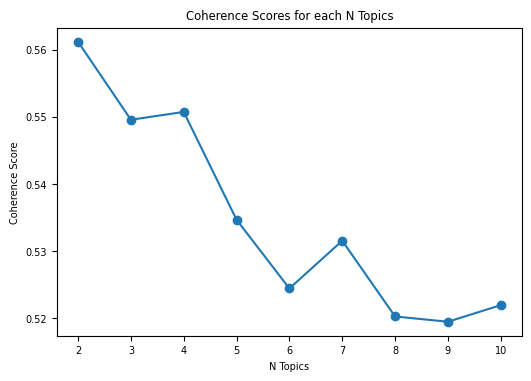

In [31]:
# create gensim dictionary and corpus
dictionary, corpus = gensim_dictionary_corpus(vocabulary, list_tokenized_docs)

# find the best number of topics
models = compute_coherence_scores(corpus, dictionary, list_tokenized_docs, max_topics = 10)

## Build best model

Choose `n_components = 3` as we saw earlier in the previous section, the best number of topics are 3.

In [32]:
LDA_model = LatentDirichletAllocation(n_components = 4,
                                      max_iter = 15,
                                      learning_method = 'batch',   
                                      batch_size = 128,
                                      n_jobs = -1,
                                      random_state = 42,
                                      verbose = 1)                                    
LDA_model.fit(data_training)

iteration: 1 of max_iter: 15
iteration: 2 of max_iter: 15
iteration: 3 of max_iter: 15
iteration: 4 of max_iter: 15
iteration: 5 of max_iter: 15
iteration: 6 of max_iter: 15
iteration: 7 of max_iter: 15
iteration: 8 of max_iter: 15
iteration: 9 of max_iter: 15
iteration: 10 of max_iter: 15
iteration: 11 of max_iter: 15
iteration: 12 of max_iter: 15
iteration: 13 of max_iter: 15
iteration: 14 of max_iter: 15
iteration: 15 of max_iter: 15


LatentDirichletAllocation(max_iter=15, n_components=4, n_jobs=-1,
                          random_state=42, verbose=1)

## Interpret the model

In [33]:
# def pecent_dominant_topic(x):
#     number = x['Dominant Topic']
#     output = x[f'Topic {int(number)}']
#     if output > 0.5:
#         return f'Topic {int(number)} (> 50%)'
#     else:
#         return 'Mixture Topics'
    
# assign the topic to each document
LDA_output = LDA_model.transform(data_training)
LDA_output = pd.DataFrame(np.round(LDA_output, 2), 
                          columns = [f'Topic {i + 1}' for i in range(LDA_model.n_components)],
                          index = [f'Doc {i + 1}' for i in range(len(LDA_output))])
LDA_output['Dominant Topic'] = np.argmax(LDA_output.values, axis = 1) + 1
# LDA_output['% Dominant Topic'] = LDA_output.apply(lambda x: pecent_dominant_topic(x), axis = 1)
display(LDA_output)

LDA_distribution = LDA_output['Dominant Topic'].value_counts().to_frame().reset_index()
LDA_distribution.columns = ['Dominant Topic', '# Docs']
display(LDA_distribution)

,Topic 1,Topic 2,Topic 3,Topic 4,Dominant Topic
Doc 1,0.53,0.43,0.02,0.02,1
Doc 2,0.15,0.02,0.02,0.82,4
Doc 3,0.01,0.09,0.63,0.28,3
Doc 4,0.14,0.67,0.00,0.19,2
Doc 5,0.01,0.18,0.15,0.65,4
...,...,...,...,...,...
Doc 2445,0.04,0.01,0.01,0.94,4
Doc 2446,0.01,0.01,0.61,0.37,3
Doc 2447,0.26,0.01,0.71,0.01,3
Doc 2448,0.04,0.01,0.94,0.01,3


,Dominant Topic,# Docs
0,4,920
1,3,670
2,2,474
3,1,385


In [34]:
def get_n_keywords(data_keywords, n_keywords):
    dict_output = {}
    for topic in data_keywords.index:
        dict_output[topic] = LDA_keywords.sort_values(by = topic, ascending = False, axis = 1).loc[topic].head(n_keywords).index.tolist()
    return dict_output

# get the top n keywords for each topic
LDA_keywords = pd.DataFrame(LDA_model.components_, 
                            columns = vocabulary, 
                            index = [f'Topic {i + 1}' for i in range(LDA_model.n_components)])
dict_output = get_n_keywords(LDA_keywords, 25)
pd.DataFrame(dict_output)

,Topic 1,Topic 2,Topic 3,Topic 4
0,hour,customer,good,seat
1,delay,tell,crew,economy
2,check,book,lounge,service
3,X minute,day,cabin,business
4,X hour,service,service,food
5,staff,cancel,food,cabin
6,minute,time,time,meal
7,passenger,check,club,pay
8,time,ticket,seat,premium
9,boarding,pay,drink,offer


From the LDA model, we can infer that,
- `Topic 1` mainly discusses about customers' **Time Issue**, such as: 
    - customers got delayed airplane. 
    - customers had to spend much more time waiting for either luggage/bag, check-in, or boarding, in which those things can spend "X minute" or "X hour" of waiting time more than they were expected.
- `Topic 2` mainly discusses about British Airways' **Customer Service/Flight Issue**, such as: 
    - customers was forced to rebook flight or got cancelled flight in "X day/week/month/year" before departure due to some reasons. 
    - customers had to wait for refund/reimbursement in so much long time (can be in X day/week/month) although they had already called, asked and tried to reach the customer service, sometimes there is no a certainty/response from them.
- `Topic 3` mainly discusses about customers' **Good-Inflight Experience** with British Airways, such as:
    - friendly and nice flight crew.
    - good at food/drink/meal/breakfast/time. 
    - having excellent service and great experience.
    - comfortable seat.
- `Topic 4` mainly discusses about customers' **Bad-Inflight Experience** with British Airways, mostly in "Economy", "Premium Economy", and "Business" classes which mostly happened during long-haul flight, such as 
    - problem with customers' leg due to airplane seat.
    - poor service from staff/flight crew. 
    - lack of offering or long-time serving food/drink/meal.
    - bad taste in food/drink/meal.
    - overall cost/pay for the flight was not as they were expected.

In [35]:
def topic_name(x):
    if x == 1:
        return 'Time Issue'
    elif x == 2:
        return 'Customer Service/Flight Issue'
    elif x == 3:
        return 'Good-Inflight Experience'
    elif x == 4:
        return 'Bad-Inflight Experience'
LDA_output['Topic Name'] = LDA_output['Dominant Topic'].apply(lambda x: topic_name(x))
LDA_output['Traveller Type'] = df_EDA_imputation['Traveller Type'].values
LDA_output['Seat Type'] = df_EDA_imputation['Seat Type'].values
LDA_output['Reviews'] = df_EDA_imputation['Reviews'].values
LDA_output['Recommended'] = df_EDA_imputation['Recommended'].values
display(LDA_output)

,Topic 1,Topic 2,Topic 3,Topic 4,Dominant Topic,Topic Name,Traveller Type,Seat Type,Reviews,Recommended
Doc 1,0.53,0.43,0.02,0.02,1,Time Issue,Couple Leisure,Economy Class,✅ Trip Verified | Our connecting flight from L...,no
Doc 2,0.15,0.02,0.02,0.82,4,Bad-Inflight Experience,Couple Leisure,Economy Class,✅ Trip Verified | The worst airline I have e...,no
Doc 3,0.01,0.09,0.63,0.28,3,Good-Inflight Experience,Solo Leisure,First Class,"✅ Trip Verified | Excellent service levels, ...",yes
Doc 4,0.14,0.67,0.00,0.19,2,Customer Service/Flight Issue,Couple Leisure,Business Class,Not Verified | Booked a very special holiday ...,no
Doc 5,0.01,0.18,0.15,0.65,4,Bad-Inflight Experience,Couple Leisure,Economy Class,"Not Verified | Just returned from Chicago, fle...",no
...,...,...,...,...,...,...,...,...,...,...
Doc 2445,0.04,0.01,0.01,0.94,4,Bad-Inflight Experience,Family Leisure,Economy Class,London to Johannesburg return with British Air...,no
Doc 2446,0.01,0.01,0.61,0.37,3,Good-Inflight Experience,Solo Leisure,Economy Class,"I usually fly on Asian airlines (ANA, EVA, Kor...",no
Doc 2447,0.26,0.01,0.71,0.01,3,Good-Inflight Experience,Family Leisure,Business Class,"Had to fly British Airways London to Delhi, du...",yes
Doc 2448,0.04,0.01,0.94,0.01,3,Good-Inflight Experience,Business,Business Class,Madrid to Los Angeles via London Heathrow. Smo...,yes


## Analyze the topics

### Proportion Topic Discussed on Reviews by Customers of whether They Recommended BA or not

- Our LDA model seems to have a quite decent performance of differentiating both positive and negative sentiment reviews.
    - For customers *recommending* BA airline, 60% of them mainly talked about positive sentiment topic, **Good-Inflight Experience**.
    - For customers *NOT recommending* BA airline, 90% of them mainly talked about negative sentiment topic, **Bad-Inflight Experience**, **Customer Service/Flight Issue**, and **Time Issue**.

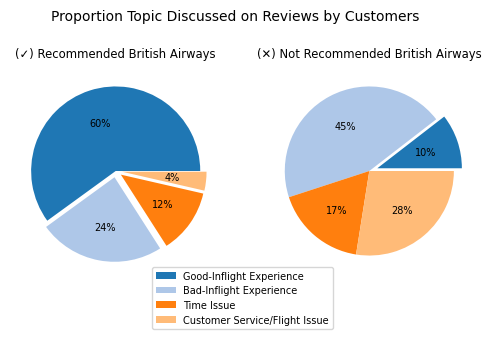

In [36]:
Recommended_TopicName = LDA_output.groupby(['Recommended', 'Topic Name']).agg({'Reviews':'count'}).rename({'Reviews':'# Reviews'}, axis = 1)
yes = Recommended_TopicName.loc['yes']
no = Recommended_TopicName.loc['no']

fig, ax = plt.subplots(figsize = (6 ,4), ncols = 2)
labels = ['Good-Inflight Experience', 'Bad-Inflight Experience', 'Time Issue', 'Customer Service/Flight Issue']
yes.loc[labels].plot(explode = [0, 0.075,0.075, 0.075], kind = 'pie', y = '# Reviews', autopct = '%.0f%%', colors = sns.color_palette('tab20'), labels = None, ax = ax[0], legend = None)
no.loc[labels].plot(explode = [0.1, 0, 0, 0], kind = 'pie', y = '# Reviews', autopct = '%.0f%%', colors = sns.color_palette('tab20'), labels = None, ax = ax[1])

ax[1].legend(labels, loc = 'center', bbox_to_anchor = (-0.1, -0.1))
ax[0].set(title = '(✓) Recommended British Airways', xlabel = None, ylabel = None)
ax[1].set(title = '(✕) Not Recommended British Airways', xlabel = None, ylabel = None)
plt.suptitle('Proportion Topic Discussed on Reviews by Customers', y = 0.9, fontsize = 10)
plt.show()

fig.savefig('image/task 1/Proportion Topic Discussed on Reviews by Customers of whether They Recommended BA or not.png', bbox_inches = 'tight', dpi = 300)

### Proportion Topic Discussed on Reviews by Business and Solo Travellers

**Business Traveller**:
- Majority Seat Types choosen by "Business" travellers are "Economy" and "Business" classes, but regardless of the seat type that they chose whether it was "Economy" or "Business", They seemed to be having **Bad-Inflight Experience** then followed by **Customer Service/Flight Issue**.
- The second most topic discussed by "Business" travellers are **Customer Service/Flight Issue**, This might be the major problem of why they gave below 5 stars rating on average. Most of "Business" travellers are more likely not to tolerate cancelled/rebooked flight as they usually have already had on-time schedule for "Business Purpose".

**Solo Traveller**:
- "Solo" travellers seemed to be having **Good-Inflight Experience** in "First" and "Business" classes.

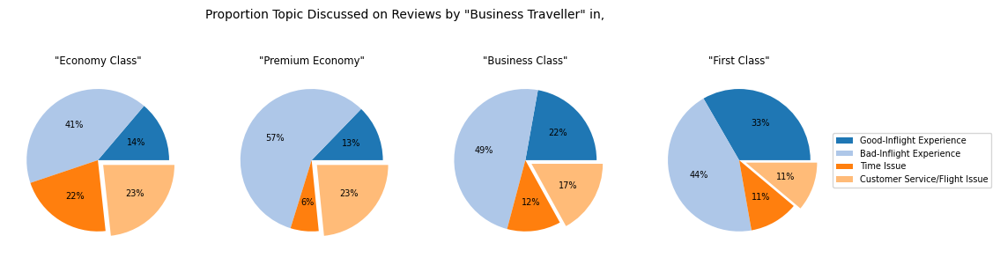

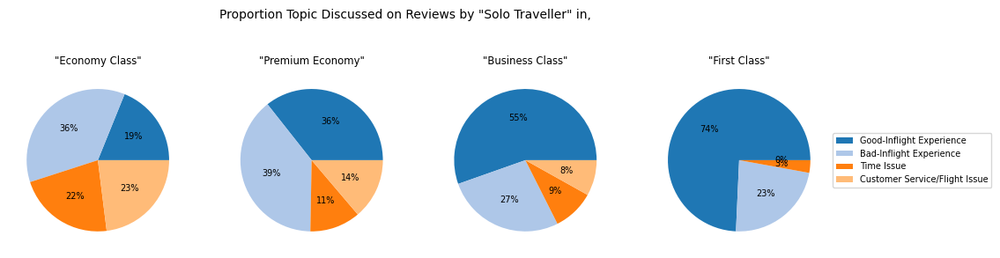

In [37]:
Traveller_Seat_TopicName = LDA_output.groupby(['Traveller Type', 'Seat Type', 'Topic Name']).agg({'Reviews':'count'}).rename({'Reviews':'# Reviews'}, axis = 1)
labels = ['Good-Inflight Experience', 'Bad-Inflight Experience', 'Time Issue', 'Customer Service/Flight Issue']

# Business Traveller
fig, ax = plt.subplots(figsize = (12,5), ncols = 4)
Business = Traveller_Seat_TopicName.loc['Business']
for i, seat in enumerate(['Economy Class', 'Premium Economy', 'Business Class', 'First Class']):
    Business.loc[seat].loc[labels].plot(explode = [0, 0, 0, 0.1], kind = 'pie', y = '# Reviews', autopct = '%.0f%%', colors = sns.color_palette('tab20'), labels = None, legend = None, ax = ax[i])
    ax[i].set(title = f'"{seat}"', xlabel = None, ylabel = None)
plt.suptitle('Proportion Topic Discussed on Reviews by "Business Traveller" in,', va = 'center', y = 0.825, fontsize = 10)
ax[3].legend(labels, loc = "center left", bbox_to_anchor = (1, 0.5))
plt.show()
fig.savefig('image/task 1/Proportion Topic Discussed on Reviews by Business Traveller for each Seat Type.png', bbox_inches = 'tight', dpi = 300)

# Solo Traveller
fig, ax = plt.subplots(figsize = (12,5), ncols = 4)
Solo = Traveller_Seat_TopicName.loc['Solo Leisure']
Solo.loc[('First Class', 'Customer Service/Flight Issue'), '# Reviews'] = 0
for i, seat in enumerate(['Economy Class', 'Premium Economy', 'Business Class', 'First Class']):
    Solo.loc[seat].loc[labels].plot(kind = 'pie', y = '# Reviews', autopct = '%.0f%%', colors = sns.color_palette('tab20'), labels = None, legend = None, ax = ax[i])
    ax[i].set(title = f'"{seat}"', xlabel = None, ylabel = None)
plt.suptitle('Proportion Topic Discussed on Reviews by "Solo Traveller" in,', va = 'center', y = 0.825, fontsize = 10)
ax[3].legend(labels, loc = "center left", bbox_to_anchor = (1, 0.5))
plt.show()
fig.savefig('image/task 1/Proportion Topic Discussed on Reviews by Solo Traveller for each Seat Type.png', bbox_inches = 'tight', dpi = 300)

# Recomendations

**Delayed/Cancelled Airline**
- Be transparent about the reasons of delayed and cancelled flights.
- Offer compensation (in the form of snacks/vouchers/cashes) if the delayed/cancelled airplane is due to factors within their control, such as maintenance issues all of sudden.
- If the delay results in an overnight stay, the airline should provide vouchers for food and accommodation to stay overnight.
- If the customer is in a hurry to get the destination on-time (especially “Business” traveller), the airline should provide alternative transportation such as a train or rental-car if it’s possible, to ensure the customer reaches their destination on-time.

**Other Categories**
- Keep assisting and getting in touch with customers in seeking for compensation/reimbursement/refund from the airline.
- Handle the compensation/reimbursement/refund as soon as possible.
- Re-design the seat on airplane so that can provide comfort, especially for those who have long leg problem .
- Ensure that airline staff are well-trained, motivated, and satisfied with their jobs. Happy employees are more likely to provide excellent customer service.
- Offer high-quality food and beverage, and give more options on food and beverage.
- Minimize mishandled baggage incidents.

# References

1. [Generating WordClouds in Python Tutorial](https://www.datacamp.com/tutorial/wordcloud-python)
2. [Topic Modeling with Gensim (Python)](https://www.machinelearningplus.com/nlp/topic-modeling-gensim-python/#google_vignette)
3. [LDA in Python – How to grid search best topic models?](https://www.machinelearningplus.com/nlp/topic-modeling-python-sklearn-examples/#1introduction)
4. [Topic Modeling in Python: Latent Dirichlet Allocation (LDA)](https://towardsdatascience.com/end-to-end-topic-modeling-in-python-latent-dirichlet-allocation-lda-35ce4ed6b3e0)
5. [Evaluate Topic Models: Latent Dirichlet Allocation (LDA)](https://towardsdatascience.com/evaluate-topic-model-in-python-latent-dirichlet-allocation-lda-7d57484bb5d0)
6. [How to generate an LDA Topic Model for Text Analysis](https://yanlinc.medium.com/how-to-build-a-lda-topic-model-using-from-text-601cdcbfd3a6)